<a href="https://colab.research.google.com/github/JungOhLee/LiTS_example/blob/main/PrepareDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [2]:
!ls /gdrive

MyDrive  Othercomputers


In [3]:
!ls /gdrive/MyDrive/LiTS_sample

archive.zip


In [4]:
!pwd

/content


In [5]:
import os

In [11]:
!cp /gdrive/MyDrive/LiTS_sample/archive.zip /content/archive.zip

In [18]:
!unzip archive.zip

Archive:  archive.zip
  inflating: segmentations/segmentation-0.nii  
  inflating: segmentations/segmentation-1.nii  
  inflating: segmentations/segmentation-10.nii  
  inflating: segmentations/segmentation-100.nii  
  inflating: segmentations/segmentation-101.nii  
  inflating: segmentations/segmentation-102.nii  
  inflating: segmentations/segmentation-103.nii  
  inflating: segmentations/segmentation-104.nii  
  inflating: segmentations/segmentation-105.nii  
  inflating: segmentations/segmentation-106.nii  
  inflating: segmentations/segmentation-107.nii  
  inflating: segmentations/segmentation-108.nii  
  inflating: segmentations/segmentation-109.nii  
  inflating: segmentations/segmentation-11.nii  
  inflating: segmentations/segmentation-110.nii  
  inflating: segmentations/segmentation-111.nii  
  inflating: segmentations/segmentation-112.nii  
  inflating: segmentations/segmentation-113.nii  
  inflating: segmentations/segmentation-114.nii  
  inflating: segmentations/segment

In [19]:
!ls

archive.zip    volume_pt1  volume_pt3  volume_pt5
segmentations  volume_pt2  volume_pt4


In [20]:
path = "/content/volume_pt1/volume-1.nii"

In [35]:
import nibabel as nib
import numpy as np
nifti_file = nib.load(path)
img = nifti_file.get_fdata()

In [37]:
img.shape

(512, 512, 123)

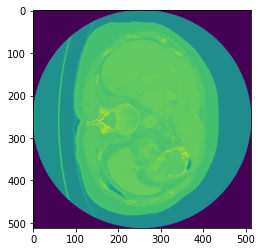

In [39]:
import matplotlib.pyplot as plt

test = img[:,:,59]
plt.imshow(test)
plt.show()

In [42]:
def adjust_window(image, window):
    width = window[0]
    level = window[1]
    upper = level+width/2
    lower = level-width/2
    copied_image = image.copy()
    copied_image[copied_image<lower] = lower
    copied_image[copied_image>upper] = upper
    copied_image = copied_image-lower
    return (copied_image/(upper-lower)*255).round().astype(np.uint8)

adj_img = adjust_window(img, (700,200))

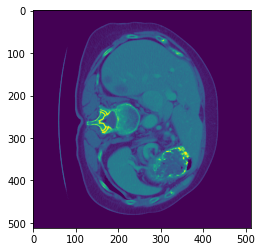

In [43]:
plt.imshow(adj_img[:,:,59])
plt.show()

In [44]:
seg_path = "segmentations/segmentation-1.nii"

In [45]:
seg = nib.load(seg_path).get_fdata()

In [48]:
seg.shape

(512, 512, 123)

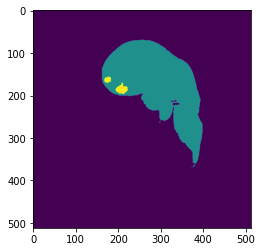

In [47]:
plt.imshow(seg[:,:,59])

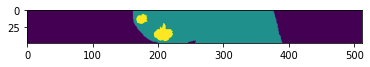

In [51]:
plt.imshow(seg[150:200,:,59])

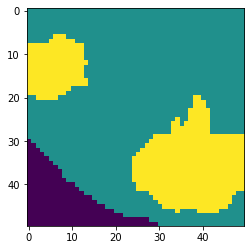

In [52]:
plt.imshow(seg[150:200,170:220,59])

In [54]:
seg[150:200,170:220,59]

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

In [55]:
img_50 = nib.load('volume_pt5/volume-50.nii').get_fdata()
seg_50 = nib.load('segmentations/segmentation-50.nii').get_fdata()

In [57]:
print(img_50.shape, seg_50.shape)

(512, 512, 240) (512, 512, 240)


In [59]:
!pip install SimpleITK

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 10.7 MB/s eta 0:00:00


In [60]:
import SimpleITK as sitk
from skimage import color
from skimage import io

def slice_img(img, offset, end, interval):
  if end is None:
    end = len(img)
  else: 
    if end > len(img): 
      end = len(img)
    if end <= offset:
      end = offset + 1
  return img[offset:end:interval]

def show_numpy_img(np_img, offset=0, end=None, interval=5, title=''): 
  sliced_img = slice_img(np_img, offset, end, interval)

  figsize_per_img = 3
  num_col = 5
  num_row = int(np.ceil(sliced_img.shape[0] / num_col))
  # fig, axs = plt.subplots(num_row, num_col, figsize = (figsize_per_img*num_col, figsize_per_img*num_row))
  plt.figure(figsize=(figsize_per_img*num_col, figsize_per_img*num_row))
  for i, img in enumerate(sliced_img):
    if i >= num_col*num_row:
      continue
    # axs[i].imshow(img)
    plt.subplot(num_row, num_col, i+1)
    plt.imshow(img, 'gray')
    # plt.title()
  plt.suptitle(title)
  plt.tight_layout()
  plt.show()


In [75]:
#image, label 동시에 그려줌
def plot_img_and_label(np_img, label, interval = 5, offset = 0, end=None, figsize_per_image = 5):
  sliced_img = slice_img(np_img, offset, end, interval)
  sliced_label = slice_img(label, offset, end, interval)
  
  num_row = len(sliced_img)
  num_col = 2

  f = plt.figure(figsize=(figsize_per_image*num_col, figsize_per_image*num_row))

  for i in range(0, num_row):
    plt.subplot(num_row, num_col, i*num_col+1)
    tissue_image = sliced_img[i]
    plt.imshow(tissue_image, 'gray')

    plt.subplot(num_row, num_col, i*num_col+2)
    mask = sliced_label[i]
    # # Method with SimpleITK
    # label_on_tissue = sitk.LabelMapContourOverlay(sitk.Cast(sitk.GetImageFromArray(mask), sitk.sitkLabelUInt8), sitk.GetImageFromArray(tissue_image), opacity=0.7, contourThickness=[2,2], colormap=(0,255,0))
    # plt.imshow(sitk.GetArrayFromImage(label_on_tissue), 'gray')
    # Method with skimage
    label_on_tissue = color.label2rgb(mask,tissue_image, bg_label=0)
    plt.imshow(label_on_tissue)

  plt.tight_layout()
#   plt.show()
  return f

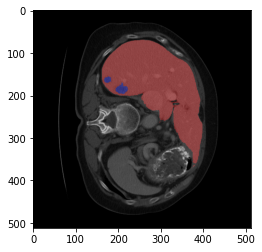

In [73]:
from skimage import color
from skimage import io

plt.imshow(color.label2rgb(seg[:,:,59],adj_img[:,:,59], bg_label=0))

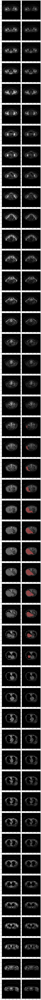

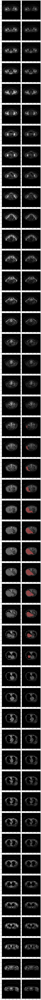

In [80]:
%matplotlib inline
adj_image = adjust_window(img_50, (700,200))
plot_img_and_label(adj_image.transpose([2,1,0]), seg_50.astype(np.uint8).transpose([2,1,0]))
# 왜 두 번 찍히지? 

In [83]:
!mkdir image
!mkdir mask

In [84]:
!ls

archive.zip  mask	    volume_pt1	volume_pt3  volume_pt5
image	     segmentations  volume_pt2	volume_pt4


In [85]:
import shutil

In [88]:
seg_files = [f"segmentation-{i}.nii" for i in range(51)]

In [91]:
for seg_file in seg_files:
  shutil.move(f"segmentations/{seg_file}", f"mask/{seg_file}")

In [92]:
for i in range(1,6):
  for image_file in os.listdir(f"volume_pt{i}"):
    shutil.move(f"volume_pt{i}/{image_file}", f"image/{image_file}")

In [93]:
!ls mask

segmentation-0.nii   segmentation-25.nii  segmentation-40.nii
segmentation-10.nii  segmentation-26.nii  segmentation-41.nii
segmentation-11.nii  segmentation-27.nii  segmentation-42.nii
segmentation-12.nii  segmentation-28.nii  segmentation-43.nii
segmentation-13.nii  segmentation-29.nii  segmentation-44.nii
segmentation-14.nii  segmentation-2.nii   segmentation-45.nii
segmentation-15.nii  segmentation-30.nii  segmentation-46.nii
segmentation-16.nii  segmentation-31.nii  segmentation-47.nii
segmentation-17.nii  segmentation-32.nii  segmentation-48.nii
segmentation-18.nii  segmentation-33.nii  segmentation-49.nii
segmentation-19.nii  segmentation-34.nii  segmentation-4.nii
segmentation-1.nii   segmentation-35.nii  segmentation-50.nii
segmentation-20.nii  segmentation-36.nii  segmentation-5.nii
segmentation-21.nii  segmentation-37.nii  segmentation-6.nii
segmentation-22.nii  segmentation-38.nii  segmentation-7.nii
segmentation-23.nii  segmentation-39.nii  segmentation-8.nii
segmentation-

In [94]:
!ls image

volume-0.nii   volume-1.nii   volume-2.nii   volume-3.nii   volume-4.nii
volume-10.nii  volume-20.nii  volume-30.nii  volume-40.nii  volume-50.nii
volume-11.nii  volume-21.nii  volume-31.nii  volume-41.nii  volume-5.nii
volume-12.nii  volume-22.nii  volume-32.nii  volume-42.nii  volume-6.nii
volume-13.nii  volume-23.nii  volume-33.nii  volume-43.nii  volume-7.nii
volume-14.nii  volume-24.nii  volume-34.nii  volume-44.nii  volume-8.nii
volume-15.nii  volume-25.nii  volume-35.nii  volume-45.nii  volume-9.nii
volume-16.nii  volume-26.nii  volume-36.nii  volume-46.nii
volume-17.nii  volume-27.nii  volume-37.nii  volume-47.nii
volume-18.nii  volume-28.nii  volume-38.nii  volume-48.nii
volume-19.nii  volume-29.nii  volume-39.nii  volume-49.nii


In [96]:
image_dir = "/gdrive/MyDrive/LiTS_sample/image"
mask_dir = "/gdrive/MyDrive/LiTS_sample/mask"
shutil.copytree('image', image_dir)
shutil.copytree('mask', mask_dir) 

'/gdrive/MyDrive/LiTS_sample/mask'

In [97]:
import multiprocessing

multiprocessing.cpu_count()

2